<h1 align="center"> Hands-on-with-OpenCV </h1>

In this notebook, I have used OpenCV from basics to advanced for image and video processing tasks. 

Covered topics:

* Introduction
* Installations and Imports
* I/O Images & Video
* Resizing and Rescaling Frames
* Drawing Shapes & Putting Texts
* Color conversion
* Image Bluring
* Edge Detection
* Image Dilating
* Resizing
* Imgae cropping
* Image rotation
* Image Flipping
* Image Eroding
* Bitwise operations
* Image translation
* Image transformations
* Contour Detection 
* Color spaces
* Color channels
* Histogram computation
* Masking
* Thresholding/Binarizing Images
* Edge detection
* Face Detection
* Face Recognition

## Introduction

OpenCV, short for **Open Source Computer Vision** Library, is a powerful and widely-used open-source library that provides a comprehensive set of tools and functions for computer vision and image processing tasks. Developed originally by Intel and now maintained by the OpenCV community, it has become the go-to framework for working with images and videos in a wide range of applications.

It offers support for various programming languages, including C++, Python, and Java

## Installation & Imports

In [2]:
! pip install opencv-contrib-python

In [171]:
#imports
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import os


In [4]:
#check opencv version

print(f"OpenCV current version {cv.__version__}")

OpenCV current version 4.8.0


## Read Images & Videos

**Reading Images**

In `assets` folder I have some subfolders containing images. Let's pick the path of one of it and try to read it.

In [5]:
img_path = "assets/Photos/cat.jpg"

img = cv.imread(img_path)

print(img)

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]


So, the `img` is just a matrix of numbers. Let's check the shape.  

In [6]:
print(f"Image is of the shape {img.shape}")

Image is of the shape (427, 640, 3)


Image is having size `427X640` with `3` channels namely `BGR -> Blue Green Red`, openCV read images in BGR fashion unlike `matplotlib` which read in `RGB` fashion.

**Displaying Images**

In openCV we can use `cv.imshow(img_array)` but it may not work as expected in Jupyter Notebooks due to the underlying GUI framework. 

So, for displaying images I am using `matplotlib.pyplot` library and `plt.imshow(img_array)` method. We need to convert the color channel from  `BGR` to `RGB`.

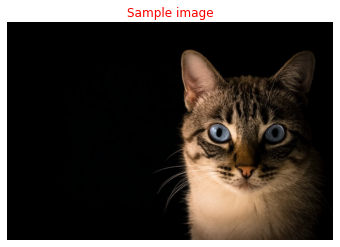

In [7]:
img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

plt.imshow(img_rgb)
plt.title('Sample image', color = 'red')
plt.axis('off')
plt.show()

Let's define a function for displaying images. 

In [8]:
#input image arrays and titles


def display_images(images, titles=None, cols=2, figsize=(10, 6), cv2_image= True):
    
    num_images = len(images)
    rows = (num_images - 1) // cols + 1

    fig, axes = plt.subplots(rows, cols, figsize=figsize)

    for i, (image, ax) in enumerate(zip(images, axes.flatten())):
        
        #if input is from cv.imread(), change the channel from BGR to RGB
        image = cv.cvtColor(image, cv.COLOR_BGR2RGB) if(cv2_image)  else image
        ax.imshow(image)
        ax.axis('off')
        if titles is not None:
            ax.set_title(titles[i])

    # Remove any empty subplots
    if num_images < rows * cols:
        for j in range(num_images, rows * cols):
            fig.delaxes(axes.flatten()[j])

    plt.tight_layout()
    plt.show()


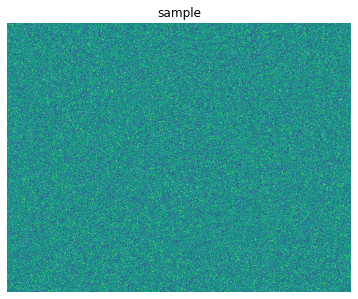

In [9]:
#create a random values for testing
rand_img = np.random.rand(720, 920)
display_images([rand_img], ["sample"], cv2_image=False)

**Reading Videos**

In [10]:
video_path = "assets/Photos/cat.jpg"

img = cv.VideoCapture(video_path)

print(img)

< cv2.VideoCapture 0x7fc0192e1630>


**Reading Videos**

In [11]:
capture = cv.VideoCapture("assets/Videos/dog.mp4")

Videos are just collection of multiple images/frames. We can display videos frame by frame just like images.

In [12]:
# Get the total number of frames in the video
total_frames = int(capture.get(cv.CAP_PROP_FRAME_COUNT))

print("Total frames:", total_frames)

Total frames: 336


**Frame visualization**

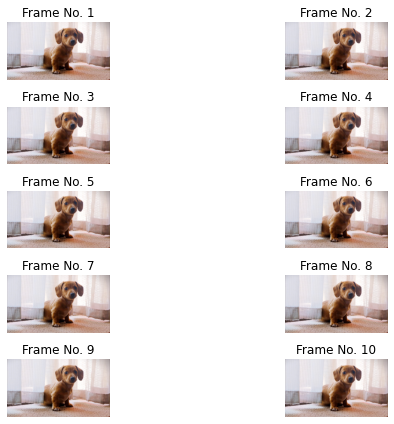

In [13]:
isTrue = True
frame_list = []

while isTrue:
    
   isTrue, frame = capture.read()

   if not isTrue:
      break  
   #collect all the frames
   frame_list.append(frame)

titles = list(map(lambda x:"Frame No. "+str(x+1), range(len(frame_list))))

display_images(frame_list[:10], titles[:10], cols=2, figsize=(10, 6), cv2_image= True)
    

**Writing to disk**

For writing purposes we can use `cv2.imwrite(filename, img, [params])` method of OpenCV.

Where : 

- **filename** : The name of the file to which you want to save the image, including the file extension (e.g., "output.jpg", "image.png").
- **img** : The image data that you want to save.
- **params (optional)** : Additional parameters that specify the image compression quality or format-specific options.

In [14]:
#funtion for writing images to disk

def save_image(img_arr, file_name, path = None):

    path = file_name if path is None else path+"/"+file_name

    print(f"Input path : {path}")
    cv.imwrite(path, img_arr)


In [15]:
#test the above function
#read a image from assets folder 

img_arr = cv.imread("assets/Photos/group 1.jpg")

#save it as writing_test.jpg

save_image(img_arr, "writing_test.jpg")


Input path : writing_test.jpg


## Resizing & Rescaling Image Frames

For resizing and rescaling purposes, we can use `cv2.resize(src, dsize[, dst[, fx[, fy[, interpolation]]]])` function from OpenCV.

Where :

- **src** : The source image that you want to resize.
- **dsize** : The desired size of the output image, specified as a tuple *(width, height)*.
- **dst** (optional) : The output image. If not specified, a new image is created.
- **fx (optional)** : The scaling factor for the horizontal dimension.
- **fy (optional)** : The scaling factor for the vertical dimension.
- **interpolation (optional)** : The interpolation method to use. It can be one of the following values: *cv2.INTER_NEAREST, cv2.INTER_LINEAR, cv2.INTER_CUBIC, or cv2.INTER_LANCZOS4*. The default value is *cv2.INTER_LINEAR*.

In [16]:
#function for rescaling/resizing images

#scale - scale by which we want to upsample or downsample images

def rescale_frame(frame, scale = 0.75):

    height, width = frame.shape[:2]

    new_height = int(height*scale)
    new_width = int(width*scale)

    resized_img = cv.resize(frame, (new_width, new_height), interpolation=cv.INTER_AREA)

    return resized_img



In [17]:
import matplotlib.pyplot as plt
#test the above function
big_cat = cv.imread("/Users/ajitkumarsingh/Desktop/Hands-on-with-openCV/assets/Photos/cat_large.jpg")
#let's resize the images by 0.75
resized_big_cat = rescale_frame(big_cat, 0.5)

#check the shape

print(f"Big cat's image size : {big_cat.shape}")
print(f"Resized big cat's image size : {resized_big_cat.shape}")


Big cat's image size : (1600, 2400, 3)
Resized big cat's image size : (800, 1200, 3)


`height` and `width` for the original image got reduced by `3/4`

## Color Spaces


OpenCV supports several color spaces that are commonly used in image processing and computer vision applications. Here are some of the most frequently used color spaces in OpenCV:

- **BGR (Blue-Green-Red)**: The default color space in OpenCV. In this color space, each pixel is represented by three color channels: Blue, Green, and Red. It is widely used in image and video processing tasks.

- **RGB (Red-Green-Blue)**: Another commonly used color space, where each pixel is represented by three color channels: Red, Green, and Blue. Unlike BGR, RGB is more commonly used in computer graphics and visualization.

- **Grayscale**: A single-channel color space where each pixel represents the intensity of gray. It is often used in situations where color information is not necessary or when reducing the computational complexity of an algorithm.

- **HSV (Hue-Saturation-Value)**: A color space that separates the color information (hue) from the saturation and value components. It is particularly useful in applications that involve color-based image segmentation and object detection.

- **Lab (CIE Lab):** A color space designed to mimic human perception. It consists of three channels: L* (lightness), a* (green-red component), and b* (blue-yellow component). Lab color space is often used in applications involving color image analysis and color correction.

**BGR to RGB color conversion**

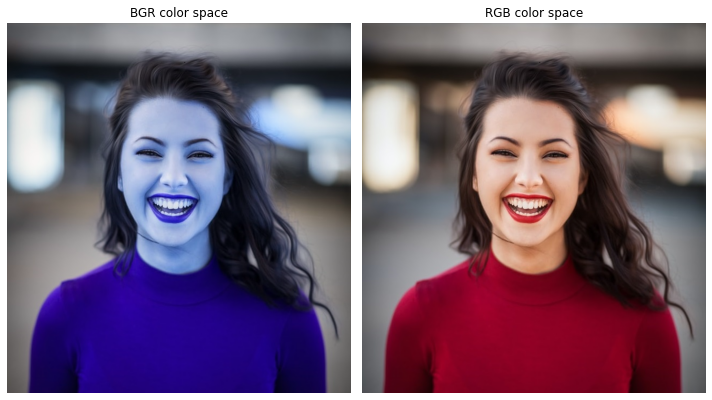

In [18]:
#read an image
lady_img = cv.imread("assets/Photos/lady.jpg")

#the order of color channel in above image is BGR (default color space in opencv)
#convert into RGB color
lady_img_rgb = cv.cvtColor(lady_img, cv.COLOR_BGR2RGB)

#display both images
display_images([lady_img, lady_img_rgb], ["BGR color space", "RGB color space"], cv2_image=False)

**RGB to Greyscale color space**

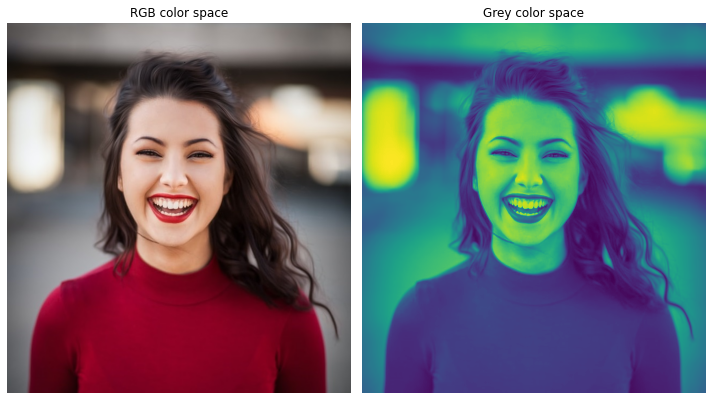

In [20]:
#read an image
lady_img = cv.imread("assets/Photos/lady.jpg")

#the order of color channel in above image is BGR (default color space in opencv)
#convert into RGB color - original image
lady_img_rgb = cv.cvtColor(lady_img, cv.COLOR_BGR2RGB)

#convert rgb image to gray scale
lady_img_grey = cv.cvtColor(lady_img_rgb, cv.COLOR_RGB2GRAY) 

#display both images
display_images([lady_img_rgb, lady_img_grey], ["RGB color space", "Grey color space"], cv2_image=False)

**Note** - grayscale images can have a wide range of gray shades, while black-and-white images strictly have only black and white pixels

**RGB to HSV color spaces**

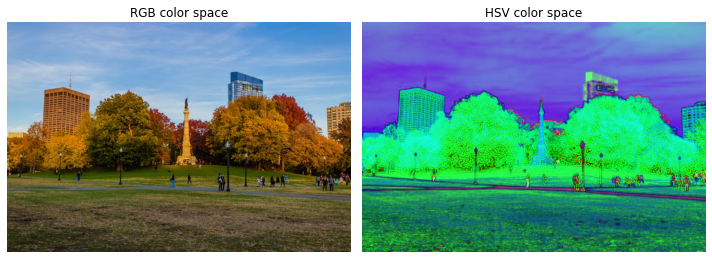

In [21]:
#read an image
park_img = cv.imread("assets/Photos/park.jpg")

#the order of color channel in above image is BGR (default color space in opencv)
#convert into RGB color - original image
park_img_rgb = cv.cvtColor(park_img, cv.COLOR_BGR2RGB)

#convert rgb image to gray scale
park_img_hsv = cv.cvtColor(park_img_rgb, cv.COLOR_RGB2HSV) 

#display both images
display_images([park_img_rgb, park_img_hsv], ["RGB color space", "HSV color space"], cv2_image=False)

**RGB to LAB color spaces**

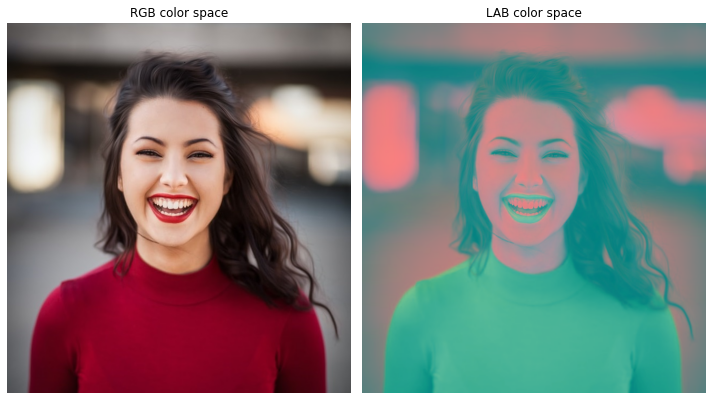

In [22]:
#read an image
lady_img = cv.imread("assets/Photos/lady.jpg")

#the order of color channel in above image is BGR (default color space in opencv)
#convert into RGB color - original image
lady_img_rgb = cv.cvtColor(lady_img, cv.COLOR_BGR2RGB)

#convert rgb image to gray scale
lady_img_lab = cv.cvtColor(lady_img_rgb, cv.COLOR_RGB2LAB) 

#display both images
display_images([lady_img_rgb, lady_img_lab], ["RGB color space", "LAB color space"], cv2_image=False)

## Color channels

In OpenCV, color images are typically represented as multi-channel arrays, where each channel corresponds to a specific color component. The number and order of color channels depend on the color space used.

OpenCV reads images with `BGR` color space by default.

For getting the individual images we can use `cv2.split(image_array)` to get individual channels.

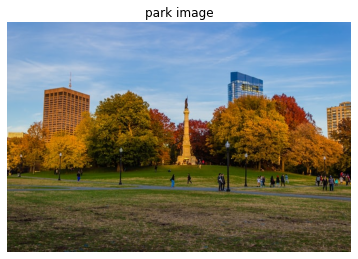

In [23]:
#read 

park_img = cv.imread("assets/Photos/park.jpg")

display_images([park_img], ["park image"])


**splitting color channels**

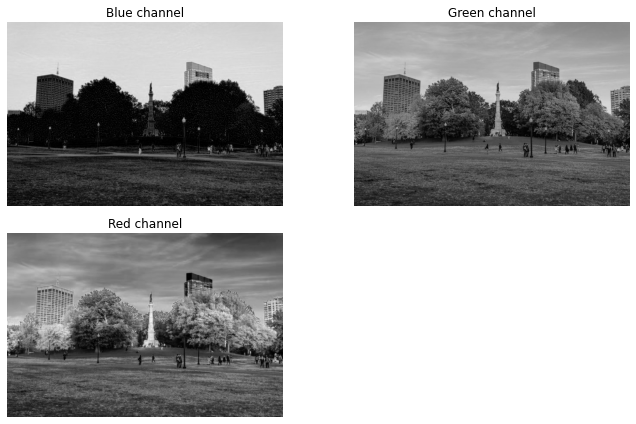

In [24]:
#split the color channels
Blue, Green, Red = cv.split(park_img)

display_images([Blue, Green, Red], ["Blue channel", "Green channel", "Red channel"])


For above individual color channel, add 2 remaining channels for each individual color channels.

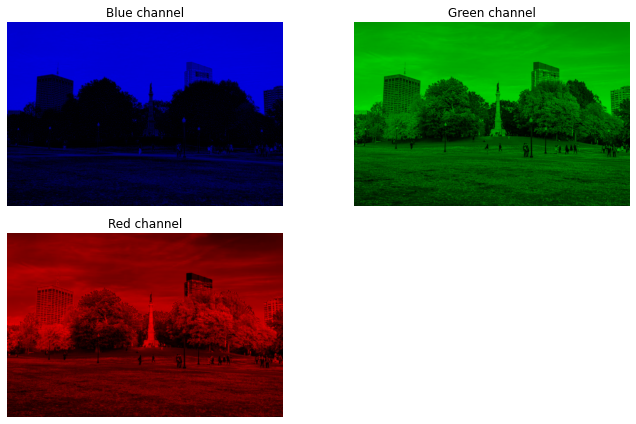

In [25]:
#create blank color channels

blank = np.zeros(park_img.shape[:2], dtype='uint8')

# add the blank channels to each individual channels
park_img_red_channel = cv.merge([blank, blank, Red])
park_img_blue_channel = cv.merge([Blue, blank, blank])
park_img_green_channel = cv.merge([blank, Green, blank])

display_images([park_img_blue_channel, park_img_green_channel, park_img_red_channel], ["Blue channel", "Green channel", "Red channel"], cv2_image=True)

**merging color channels**

To reconstruct original image from the individual channels, we can use `cv2.merge([channel1, channel2,...,channeln])` method of OpenCV.

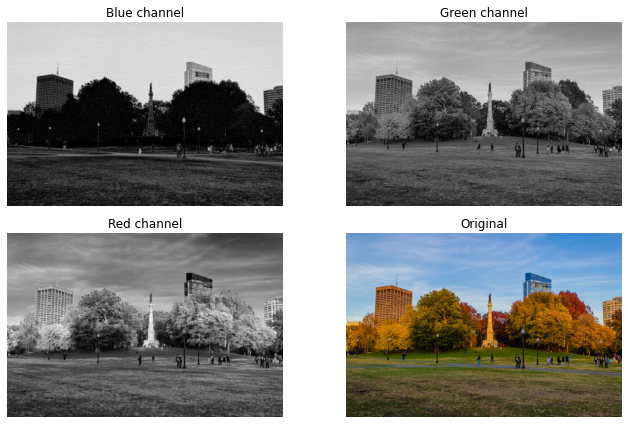

In [26]:
#split the color channels
Blue, Green, Red = cv.split(park_img)

#reconstruct the original image from Red, Green and Blue channels

orig_img = cv.merge([Blue, Green, Red])

display_images([Blue, Green, Red, orig_img], ["Blue channel", "Green channel", "Red channel", "Original"])

## Histogram Computation

- Histogram computation is a fundamental technique in image processing and computer vision that calculates the frequency distribution of pixel intensities in an image. 

- It provides valuable insights into the image's overall brightness, contrast, and distribution of pixel values. 

- Histograms are commonly used for tasks such as image enhancement, thresholding, and image analysis.

- `cv2.calcHist()` is used to compute the histogram of the grayscale image. The function takes the following parameters:

    - `[image]`: The input image. It should be a grayscale image, indicated by the [0] argument.
    - `[0]`: The channel for which the histogram is computed. Since we are working with a grayscale image, the value is [0].
    - `None`: The mask for selecting specific regions of interest in the image. If None, the entire image is used.
    - `[256]`: The number of bins or levels in the histogram. In this example, we are using 256 bins to represent the intensity levels from 0 to 255.
    - `[0, 256]`: The range of pixel intensities to be considered for the histogram calculation. Here, we are considering the entire range from 0 to 255.


In [122]:
#orig image
lady_img = cv.imread("assets/Photos/lady.jpg")

#grey scale conversion
lady_img_gray = cv.cvtColor(lady_img, cv.COLOR_BGR2GRAY)

gray_hist = cv.calcHist([lady_img], [0], None, [256], [0, 256])


gray_hist.shape

(256, 1)

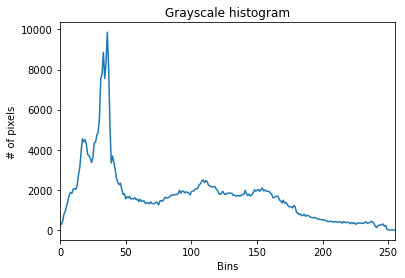

In [123]:
plt.figure()
plt.title('Grayscale histogram')
plt.xlabel("Bins")
plt.ylabel("# of pixels")
plt.plot(gray_hist)
plt.xlim([0, 255])
plt.show()


**Color channels Histogram**

Let's visualize the pixel intensities in each color channels.

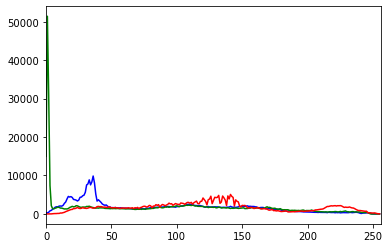

In [124]:
#orig image
lady_img = cv.imread("assets/Photos/lady.jpg")

#define color channels
colors = ('b', 'g', 'r')

for i, col in enumerate(colors):
    hist = cv.calcHist([lady_img], [i], None, [256], [0, 256])
    plt.plot(hist, color=col)
    plt.xlim([0, 256])
plt.show()

**Color histogram for masked images**

## Image Blurring/Smoothing


Image blurring, also known as image smoothing or image filtering, is a common image processing technique used to reduce noise, remove fine details, or achieve a more uniform appearance. OpenCV provides various functions to perform image blurring with different blurring algorithms.

Here are some of the commonly used image blurring techniques in OpenCV:

- Gaussian Blurring
- Average Blurring
- Median Blurring

**Gaussian Blurring**

- Gaussian blurring is a widely used technique that applies a Gaussian kernel to the image, which results in a smoother appearance.

- Gaussian blur is effective in reducing noise and removing fine details while preserving the overall structure of the image.

- The `cv2.GaussianBlur(src_image, ksize, sigmaX, sigmaY, borderType)` function is used for Gaussian blurring in OpenCV.

- `ksize` : The size of the Gaussian kernel or filter. It determines the extent of blurring. The kernel size is specified as `(width, height)` and should have positive and odd values. **Larger kernel sizes** result in more **extensive blurring**.



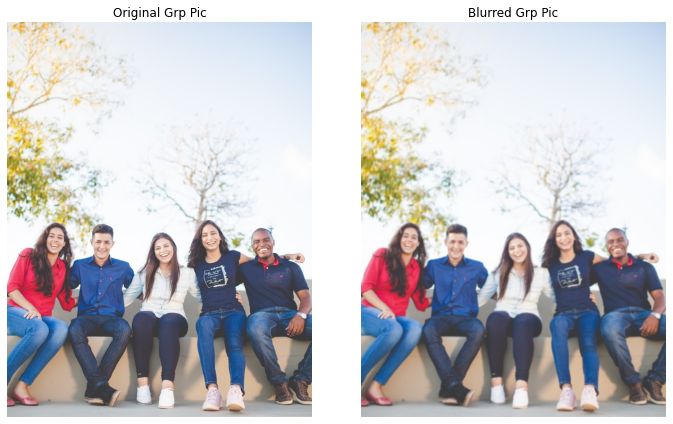

In [32]:
#gaussian blur in application
grp_img = cv.imread("assets/Photos/group 2.jpg")

#blurr the image
blur_grp_img = cv.GaussianBlur(grp_img, (5, 5), sigmaX=0, borderType=cv.BORDER_DEFAULT)

#display blurr and original image

display_images([grp_img, blur_grp_img], ["Original Grp Pic", "Blurred Grp Pic"])


**Effect of kernel size**

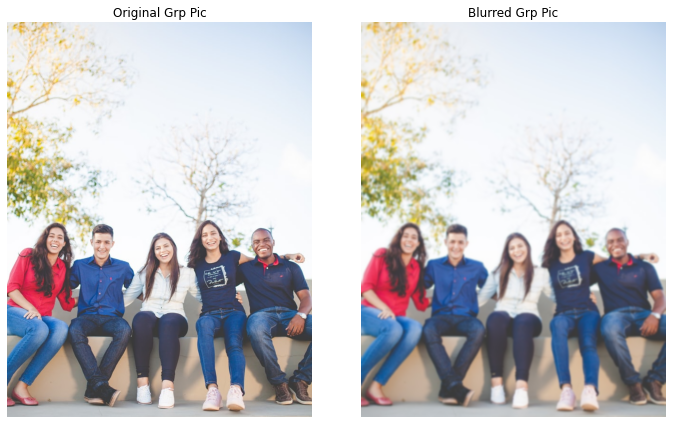

In [34]:
#gaussian blur in application
grp_img = cv.imread("assets/Photos/group 2.jpg")

#blurr the image
blur_grp_img = cv.GaussianBlur(grp_img, (9, 9), sigmaX=0, borderType=cv.BORDER_DEFAULT)

#display blurr and original image

display_images([grp_img, blur_grp_img], ["Original Grp Pic", "Blurred Grp Pic"])

Image is becoming more smoother with increase in kernel size.

**Average Blurring**

- Average blurring, also known as box blurring, replaces each pixel's value with the average value of its neighboring pixels.

- It offers a simple and fast blurring effect.

- Average blur can be useful for reducing noise and achieving a uniform appearance in images.

- The `cv2.blur(src, kernel, anchor, boderType)` function is used for average blurring in OpenCV.

- `anchor (optional)`: The anchor point of the kernel, which indicates the relative position from where the convolution is applied. By default, it is set to `(-1, -1)`, which means the anchor is at the center of the kernel.


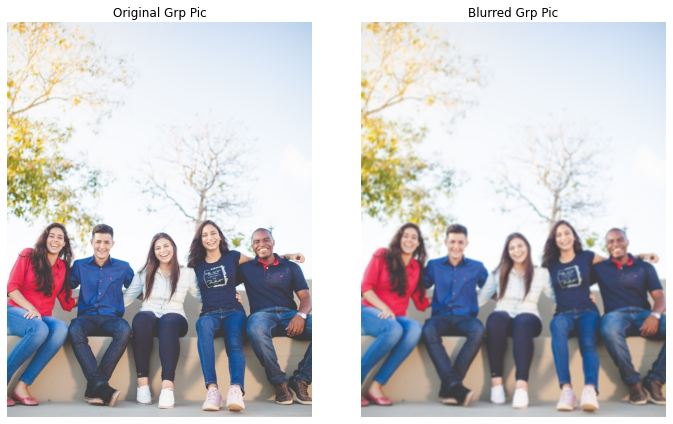

In [36]:
#gaussian blur in application
grp_img = cv.imread("assets/Photos/group 2.jpg")

#blurr the image
blur_grp_img = cv.blur(grp_img, (5, 5), borderType=cv.BORDER_DEFAULT)

#display blurr and original image

display_images([grp_img, blur_grp_img], ["Original Grp Pic", "Blurred Grp Pic"])

**Median Blurring**

- Median blurring replaces each pixel's value with the median value of its neighboring pixels, which is useful for reducing salt-and-pepper noise.

- Median blur is commonly used in image denoising applications where preserving important image structures is crucial.

- The `cv2.medianBlur(src_img, ksize)` function is used for median blurring in OpenCV.

- `ksize` should be an odd integer.


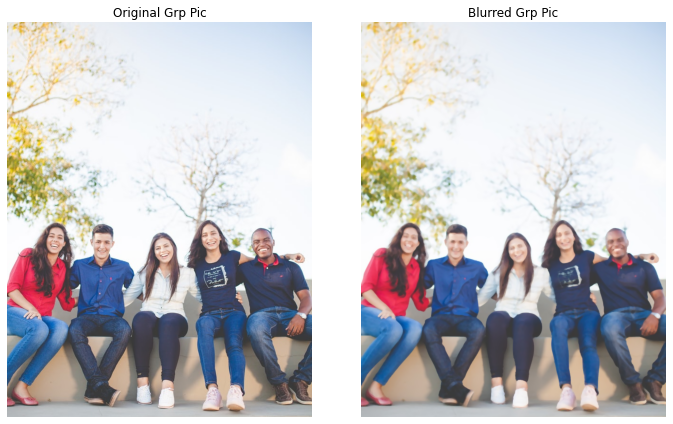

In [37]:
#gaussian blur in application
grp_img = cv.imread("assets/Photos/group 2.jpg")

#blurr the image
blur_grp_img = cv.medianBlur(grp_img, 5)

#display blurr and original image

display_images([grp_img, blur_grp_img], ["Original Grp Pic", "Blurred Grp Pic"])

**Bilateral blurring**

- Bilateral blurring is an image filtering technique in which the blurring is applied while preserving the edges in an image. 

- It is commonly used in image processing tasks where noise reduction is desired while maintaining edge sharpness, such as edge-preserving smoothing or stylization.

- It effectively reduces noise while keeping the sharpness of edges intact. The `cv2.bilateralFilter(src_img, d, sigmaColor, sigmaSpace, borderType)` function in OpenCV is used to apply bilateral blurring.

-  `d (required)`: The diameter of the pixel neighborhood used during filtering. It defines the size of the area considered for calculating the filtering weights. A larger d value means a wider pixel neighborhood is considered.


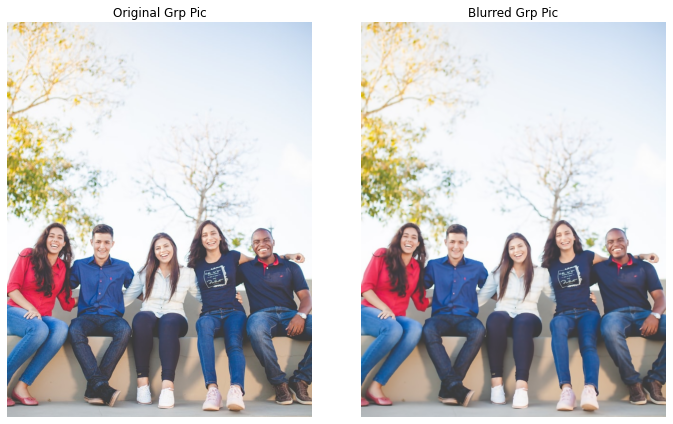

In [40]:
#gaussian blur in application
grp_img = cv.imread("assets/Photos/group 2.jpg")

#blurr the image
blur_grp_img = cv.bilateralFilter(grp_img, d = 5, sigmaColor=75, sigmaSpace=75)

#display blurr and original image

display_images([grp_img, blur_grp_img], ["Original Grp Pic", "Blurred Grp Pic"])

Let's compare each image blurring technique in single frame with same kernel size `11`.

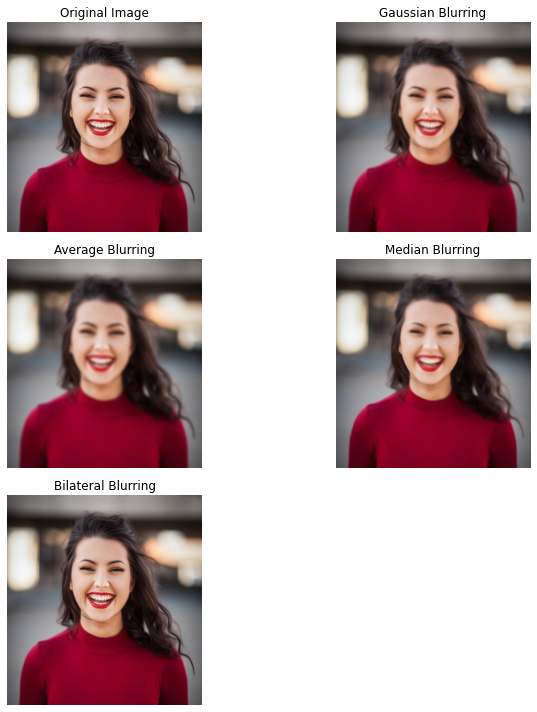

In [42]:
#gaussian blur in application
lady_img = cv.imread("assets/Photos/lady.jpg")

#gaussina blur
lady_img_gauss_blur = cv.GaussianBlur(lady_img, ksize = (11, 11), sigmaX=0)

#average blur
lady_img_avg_blur = cv.blur(lady_img, ksize = (11, 11))

#median blur
lady_img_med_blur = cv.medianBlur(lady_img, ksize = 11)

#bilateral blurring
lady_img_bil_blur = cv.bilateralFilter(lady_img, d = 11, sigmaColor = 0, sigmaSpace = 0)

#display blurr and original image
display_images([lady_img, lady_img_gauss_blur, lady_img_avg_blur, lady_img_med_blur, lady_img_bil_blur], ["Original Image", "Gaussian Blurring", "Average Blurring", "Median Blurring", "Bilateral Blurring"], figsize=(10, 10))


`Bilateral Blurring` seems perserving the original distrubution intact but depends on usecases in hand for choosing which blurring technique we should use.

## Image Cropping

In OpenCV, you can perform image cropping by selecting a region of interest (ROI) from an image and extracting that portion as a separate image. The `cv2.getRectSubPix()` function or simple array indexing can be used for image cropping.

**Using inbult functionality**

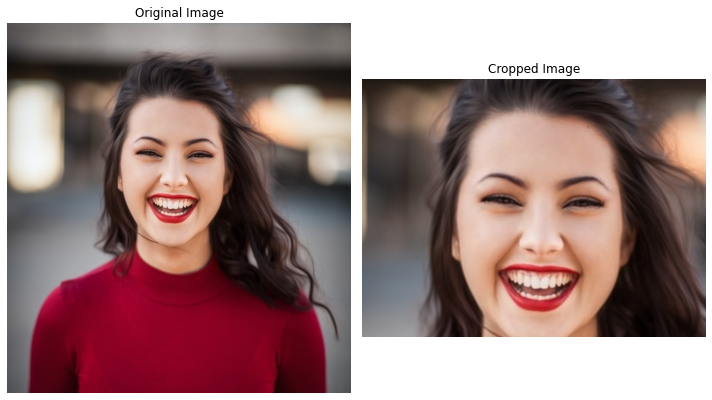

In [45]:
#gaussian blur in application
lady_img = cv.imread("assets/Photos/lady.jpg")

#x and y coordinate of the image
x = 100
y = 100

#width and height of ROI 
width = 400
height = 300

crop_img = cv.getRectSubPix(lady_img, (width, height), (x + width / 2, y + height / 2))

display_images([lady_img, crop_img], ["Original Image", "Cropped Image"])

**Using array slicing**

We can achieve same result even if we use simple array slicing operations.

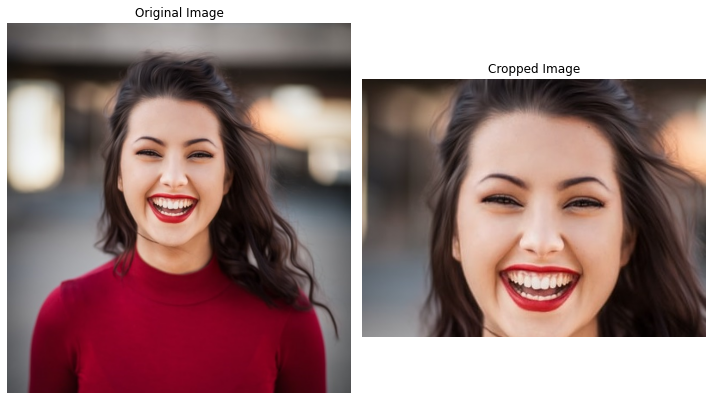

In [48]:
#gaussian blur in application
lady_img = cv.imread("assets/Photos/lady.jpg")

#use array slicing
crop_img = lady_img[100:400, 100:500]

display_images([lady_img, crop_img], ["Original Image", "Cropped Image"])

## Image Translation

- Image translation in OpenCV refers to the process of shifting an image in the horizontal and/or vertical directions. 

- It allows you to move an image by specifying the amount of displacement in the x and y directions. 

- OpenCV provides several functions and methods to perform image translation.

- `cv2.warpAffine(img, translation_matrix, img_shape)` can be used to achieve image translation.

- The `translation_matrix` is defined using the desired horizontal (`tx`) and vertical (`ty`) translations.

- Adjust the values of `tx` and `ty` to control the amount and direction of translation according to your requirements. 

- Positive values of `tx` and `ty` shift the image to the right and downwards, respectively, while negative values shift the image to the left and upwards.

- Affine transformation is a geometric transformation that preserves parallel lines and ratios of distances between points. It is a combination of translation, rotation, scaling, and shearing operations.

In [50]:
#function for translating images

def image_translation(img, disp_x, disp_y):

    #construct translation matrix
    transMat = np.float32([[1, 0, disp_x], [0, 1, disp_y]])
    #define final dimension of translated image
    dim = (img.shape[1], img.shape[0])
    #apply affine transformation
    translated_img = cv.warpAffine(img, transMat, dim)

    return translated_img

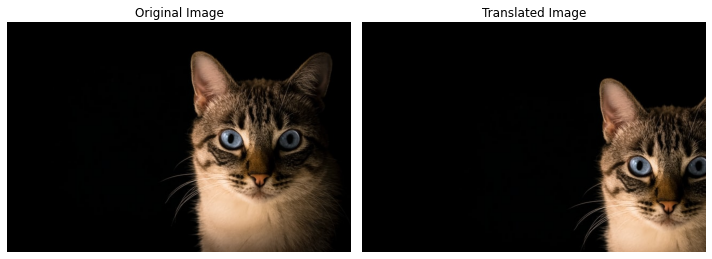

In [51]:
#orig image
cat_img = cv.imread("assets/Photos/cat.jpg")

#translate cat image by 100 px right and 50 px down
cat_img_translated = image_translation(cat_img, 100, 50)

display_images([cat_img, cat_img_translated], ["Original Image", "Translated Image"])

## Image Rotation

In OpenCV, you can perform image rotation using the `cv2.warpAffine(src_img, rotation_matrix, image_shape)` function, which applies an affine transformation to an image.

The `cv2.getRotationMatrix2D()` function computes the rotation matrix for the specified angle and scaling factor. The rotation matrix is then used in the `cv2.warpAffine()` function to apply the rotation to the image.

The `getRotationMatrix2D()` function takes three arguments:

- `center` : The center point of rotation, specified as (x, y).
- `angle` : The rotation angle in degrees. +ve angle means counter clockwise and -ve angle means clockwiseif .
- `scale` : An optional scaling factor. By default, it is set to 1.

In [56]:
def rotate_image(img, rot_angle, rot_point=None):

    #rot_point is None set it to center of the image
    height, width = img.shape[:2]
    dim = (width, height)
    center = (width//2, height//2)
    rot_point = center if rot_point is None else rot_point

    #get rotation matrix
    rot_matrx = cv.getRotationMatrix2D(rot_point, rot_angle, scale=1)

    #do affine transformation
    rot_image = cv.warpAffine(img, rot_matrx, dsize=dim)

    return rot_image


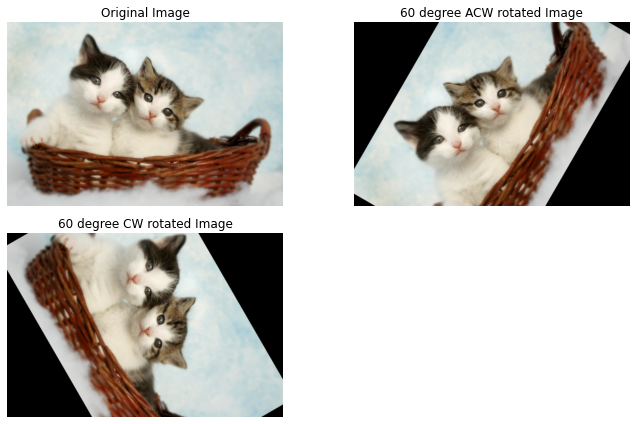

In [57]:
#test out above function
#orig image
cat_img = cv.imread("assets/Photos/cats 2.jpg")

#rotate the image by 60 degree anti clokwise from center
cat_img_rotated_acw = rotate_image(cat_img, 60)

#rotate the image by 60 degree clokwise from center
cat_img_rotated_cw = rotate_image(cat_img, -60)

display_images([cat_img, cat_img_rotated_acw, cat_img_rotated_cw], ["Original Image", "60 degree ACW rotated Image", "60 degree CW rotated Image"])


## Image Flipping

- To flip an image horizontally or vertically in OpenCV, you can use the `cv2.flip(src_img, flip_direction)` function. 

- `1` (or `0`) flips the image horizontally (or vertically).

- `-1` flips the image both horizontally and vertically.

In [58]:
#function for flipping image

def flip_image(src_img, flip_direction):

    flip_img = cv.flip(src_img, flip_direction)

    return flip_img

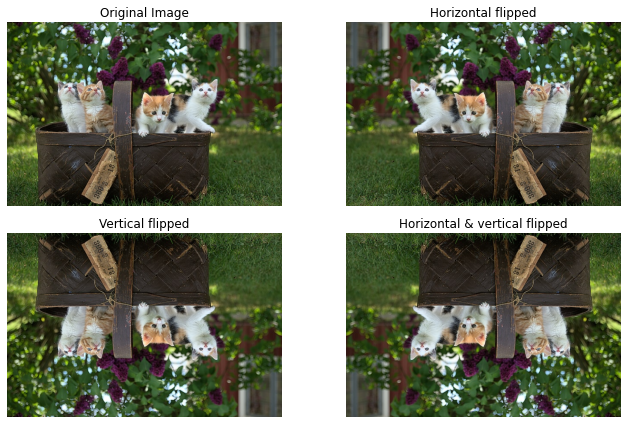

In [61]:
#test above function

#orig image
cat_img = cv.imread("assets/Photos/cats.jpg")

#flip image horizontally
cat_img_flip_horz = flip_image(cat_img, 1)

#flip image vertically
cat_img_flip_vert = flip_image(cat_img, 0)

#flip image horizontally and vertically
cat_img_flip_horz_vert = flip_image(cat_img, -1)

display_images(
                [cat_img, cat_img_flip_horz, cat_img_flip_vert, cat_img_flip_horz_vert], 
               ["Original Image", "Horizontal flipped", "Vertical flipped", "Horizontal & vertical flipped"]
               )




## Bitwise operations

- OpenCV provides several bitwise operations that allow you to perform bitwise logical operations on binary images or manipulate individual bits of pixel values. 

- These operations are useful for tasks like masking, combining images, or extracting specific regions.

Here are some common bitwise operations available in OpenCV:

- `Bitwise AND` (*cv2.bitwise_and()*) 

- `Bitwise OR` (*cv2.bitwise_or()*)

- `Bitwise XOR` (*cv2.bitwise_xor()*)

- `Bitwise NOT` (*cv2.bitwise_not()*)


**Bitwise AND**

Performs a bitwise AND operation between two input images, preserving the common foreground pixels or set bits.

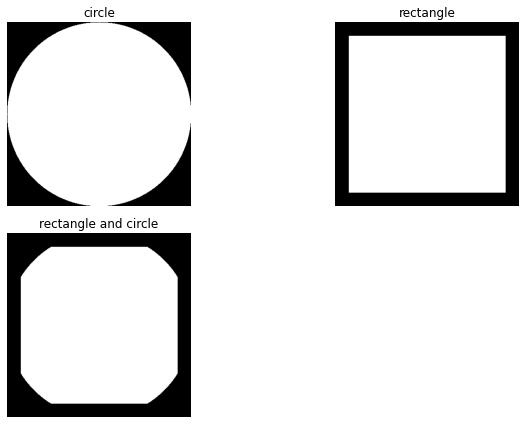

In [103]:
#lets draw a circle and rectangle over a blank image

blank = np.zeros((400, 400), dtype='uint8')

rectangle = cv.rectangle(blank.copy(), (30, 30), (370, 370), 255, -1)

circle = cv.circle(blank.copy(), (200,200), 200, 255, -1)

#bitwise and

rect_and_circle = cv.bitwise_and(rectangle, circle)


display_images([circle, rectangle, rect_and_circle], ["circle", "rectangle", "rectangle and circle"])

The resultant image is intersection between circle area and rectangle area.

**Bitwise OR**

Performs a bitwise OR operation between two input images, preserving the set bits from either image.

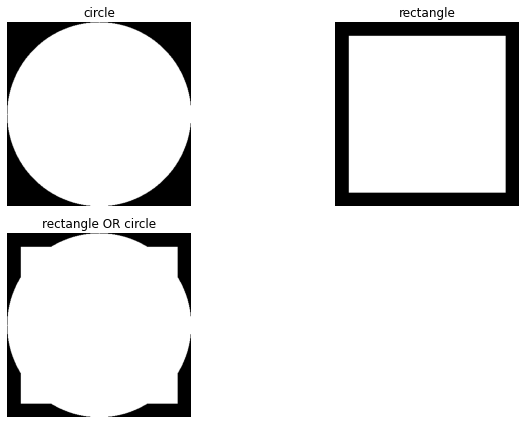

In [105]:
#lets draw a circle and rectangle over a blank image

blank = np.zeros((400, 400), dtype='uint8')

rectangle = cv.rectangle(blank.copy(), (30, 30), (370, 370), 255, -1)

circle = cv.circle(blank.copy(), (200,200), 200, 255, -1)

#bitwise and

rect_and_circle = cv.bitwise_or(rectangle, circle)


display_images([circle, rectangle, rect_and_circle], ["circle", "rectangle", "rectangle OR circle"])

The resultanr area is area covered by circle plus area covered by rectangle.

**Bitwise XOR**

Performs a bitwise XOR (exclusive OR) operation between two input images, preserving the set bits that are unique to either image.

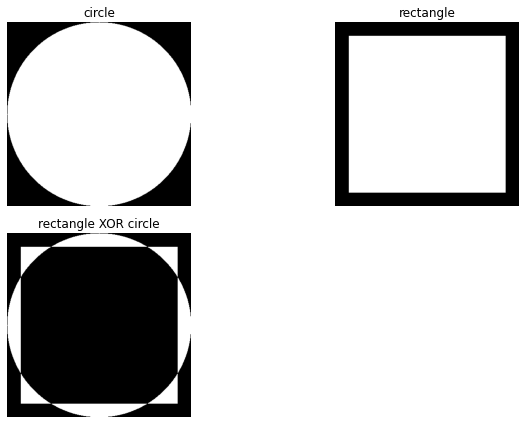

In [106]:
#lets draw a circle and rectangle over a blank image

blank = np.zeros((400, 400), dtype='uint8')

rectangle = cv.rectangle(blank.copy(), (30, 30), (370, 370), 255, -1)

circle = cv.circle(blank.copy(), (200,200), 200, 255, -1)

#bitwise and

rect_and_circle = cv.bitwise_xor(rectangle, circle)


display_images([circle, rectangle, rect_and_circle], ["circle", "rectangle", "rectangle XOR circle"])

The resultant image is total area covered by both the images combined when superimposed minus common area.

**Bitwise NOT**

Performs a bitwise NOT operation on an input image, inverting the pixel values.

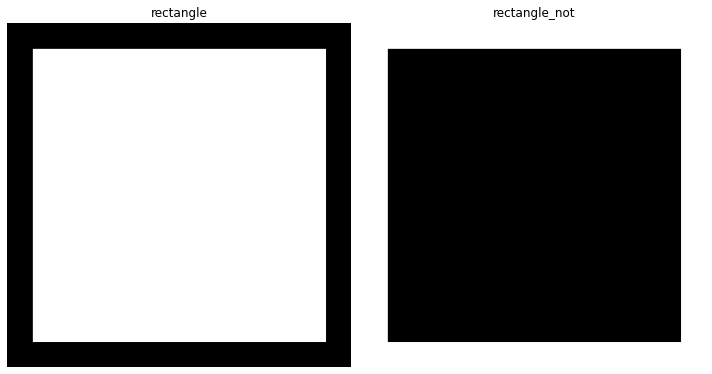

In [114]:
#lets draw a circle and rectangle over a blank image

blank = np.zeros((400, 400), dtype='uint8')

rectangle = cv.rectangle(blank.copy(), (30, 30), (370, 370), 255, -1)

#bitwise not

rect_not = cv.bitwise_not(rectangle)


display_images([rectangle, rect_not], ["rectangle", "rectangle_not"])

## Image Masking

- Image masking is a technique used to selectively apply or remove certain parts of an image based on a binary mask.

- The mask specifies which pixels should be kept (preserved) or discarded (masked out) in the image. 

- This technique is commonly used for tasks such as image segmentation, region-of-interest extraction, and applying special effects.

- In image masking, the mask is typically a binary image where pixels of interest are set to white (255) and pixels to be masked out are set to black (0). 

- By applying the mask to the original image, the desired parts are preserved, and the rest are masked out.

- Mask should be of **same shape** of the original image


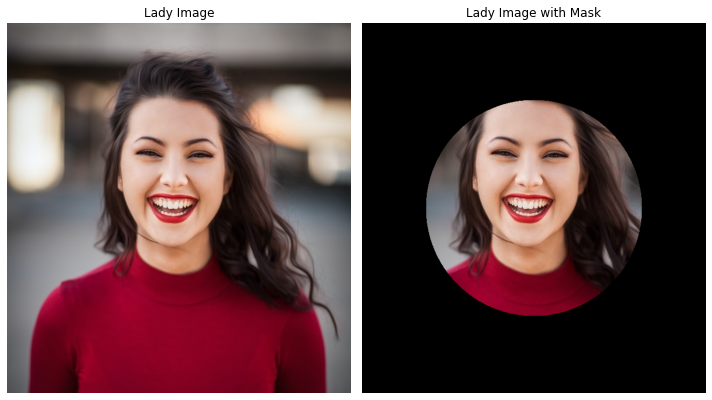

In [121]:
#orig image

lady_img = cv.imread("assets/Photos/lady.jpg")
height, width = lady_img.shape[:2]

#define mask
blank = np.zeros(lady_img.shape[:2], dtype="uint8")
#define circular mask and put center of the image as center of the circular mask
circle_mask = cv.circle(blank, (width//2, height//2), 200, 255, -1)

#impose mask over original image
lady_img_with_mask = cv.bitwise_and(lady_img, lady_img, mask = circle_mask)

display_images([lady_img, lady_img_with_mask], ["Lady Image", "Lady Image with Mask"])

## Thresholding

- Thresholding is a common image processing technique used to separate or segment regions of an image based on pixel intensity values. 

- It converts a grayscale or color image into a binary image by dividing the pixels into two categories: those that meet a specified threshold condition and those that do not.

OpenCV provides various thresholding methods, including:

- `Simple Thresholding (cv2.threshold())`

- `Adaptive Thresholding (cv2.adaptiveThreshold())`

**Simple Thresholding**

It applies a fixed threshold to the image, where pixels above the threshold are set to a specified value (e.g., 255) and pixels below the threshold are set to another value (e.g., 0)

`cv2.threshold()` is used to apply simple thresholding. The function takes the following parameters:

- `image`: The input grayscale image.
- `threshold_value`: The threshold value to compare the pixel intensities.
- `max_value`: The maximum value assigned to pixels that exceed the threshold.
- `cv2.THRESH_BINARY`: The thresholding type, which specifies that pixels above the threshold will be set to max_value.

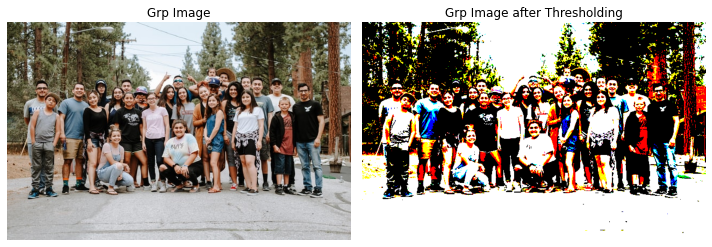

In [77]:
#orig image
grp_img = cv.imread("assets/Photos/group 1.jpg")

#thresholding
threshold, img_thrsld = cv.threshold(grp_img, 125, 255, cv.THRESH_BINARY)
#visualize
display_images([grp_img, img_thrsld], ["Grp Image", "Grp Image after Thresholding"])


**Adaptive Thresholding**

- It computes a variable threshold for each pixel based on a local neighborhood of the image.

- This method is useful when the image has varying illumination conditions or when a global threshold may not be appropriate.

`cv2.adaptiveThreshold(src, maxValue, adaptiveMethod, thresholdType, blockSize, C)` is used to apply adaptive thresholding. The function takes the following parameters:

- **src**: The source image, which should be a grayscale image (single-channel).

- **maxValue**: The maximum value assigned to pixels that exceed the threshold.

- **adaptiveMethod**: The adaptive thresholding method to be used. It can be one of the following:

    - **cv2.ADAPTIVE_THRESH_MEAN_C**: The threshold value is the mean of the neighborhood area.
    
    - **cv2.ADAPTIVE_THRESH_GAUSSIAN_C**: The threshold value is the weighted sum of the neighborhood values, where weights are calculated 
    using a Gaussian window.

- **thresholdType**: The thresholding type. It can be either cv2.THRESH_BINARY or cv2.THRESH_BINARY_INV.

- **blockSize**: The size of the neighborhood area used for calculating the threshold value. It should be an odd number (e.g., 3, 5, 7, etc.).

- **C**: The constant subtracted from the mean or weighted sum of the neighborhood values to calculate the threshold value.

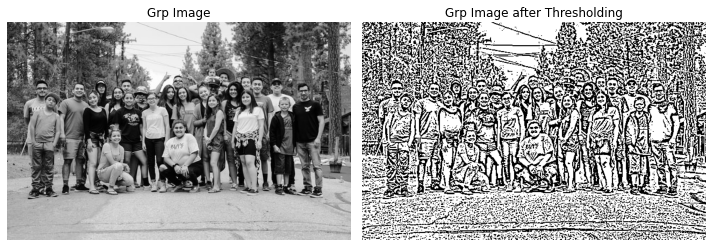

In [82]:
#orig image
grp_img = cv.imread("assets/Photos/group 1.jpg")

#grey scale conversion
grp_img_gray = cv.cvtColor(grp_img, cv.COLOR_BGR2GRAY)

#adaptive thresholding
maxValue = 255
blocksize = 11
C = 3
img_thrsld = cv.adaptiveThreshold(grp_img_gray, maxValue=maxValue, adaptiveMethod=cv.ADAPTIVE_THRESH_GAUSSIAN_C, blockSize = blocksize, C=C, thresholdType= cv.THRESH_BINARY)
#visualize
display_images([grp_img_gray, img_thrsld], ["Grp Image", "Grp Image after Thresholding"])


Let's compare both thresholding stretegy

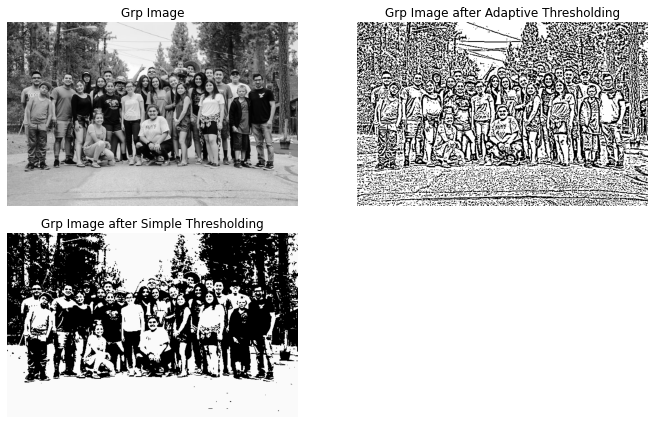

In [83]:
#orig image
grp_img = cv.imread("assets/Photos/group 1.jpg")

#grey scale conversion
grp_img_gray = cv.cvtColor(grp_img, cv.COLOR_BGR2GRAY)

#adaptive thresholding
maxValue = 255
blocksize = 11
C = 3
img_thrsld_adapt = cv.adaptiveThreshold(grp_img_gray, maxValue=maxValue, adaptiveMethod=cv.ADAPTIVE_THRESH_GAUSSIAN_C, 
                                  blockSize = blocksize, C=C, thresholdType= cv.THRESH_BINARY)

#simple thresholding
threshold, img_thrsld_smpl = cv.threshold(grp_img_gray, 125, 250, cv.THRESH_BINARY)

#visualize
display_images([grp_img_gray, img_thrsld_adapt, img_thrsld_smpl],
               ["Grp Image", "Grp Image after Adaptive Thresholding", "Grp Image after Simple Thresholding"])

Clearly, Adaptive thresholding seems more better than simple thresholding as it is preserving more informtion as compared to later one.

## Edge Cascade/Detection

An edge cascade, also known as an edge detector or edge detection algorithm, is a technique used in image processing to identify and highlight the edges or boundaries of objects within an image. It aims to locate significant variations in pixel intensity, which typically correspond to transitions from one object or region to another.

There are various edge detection algorithms available, each with its own characteristics and performance. Some popular edge detection methods include:

- **Canny Edge Detection**: The Canny edge detector is a widely used algorithm that provides good edge detection results with low noise sensitivity. It involves multiple steps, including Gaussian blurring, gradient computation, non-maximum suppression, and thresholding.

- **Sobel Operator**: The Sobel operator is a **gradient-based** edge detection method that calculates the gradient magnitude and direction of the image. It uses separate kernels to estimate the derivatives in the x and y directions and combines them to detect edges.

- **Laplacian of Gaussian (LoG)**: The LoG operator combines Gaussian blurring and Laplacian filtering to detect edges. It applies a Laplacian filter to the image after convolving it with a Gaussian filter, enhancing the edges and suppressing noise.

**Canny Edge Detetction**

It aims to accurately identify the edges or boundaries of objects in an image while reducing noise sensitivity. The Canny edge detection algorithm involves multiple steps and provides robust results.

In OpenCV we can use `cv2.Canny(image, threshold1, threshold2)` to detect edges.

- `threshold1` is the lower threshold value, used for gradient values below this threshold to be considered as non-edges.

- `threshold2` is the higher threshold value, used for gradient values above this threshold to be considered as edges.

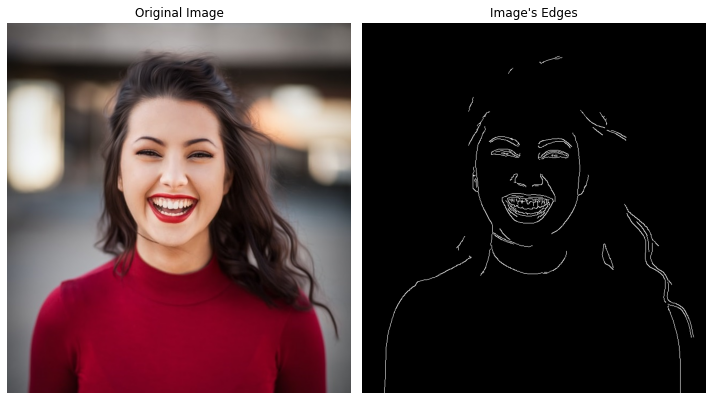

In [62]:
orig_img = cv.imread("assets/Photos/lady.jpg")

#apply canny edge detection
img_edge_canny = cv.Canny(orig_img, 100, 250)

#visualize the images
display_images([orig_img, img_edge_canny], ["Original Image", "Image's Edges"])

**Effect of blurness on edges**

The smoothing of images reduce the number edges.

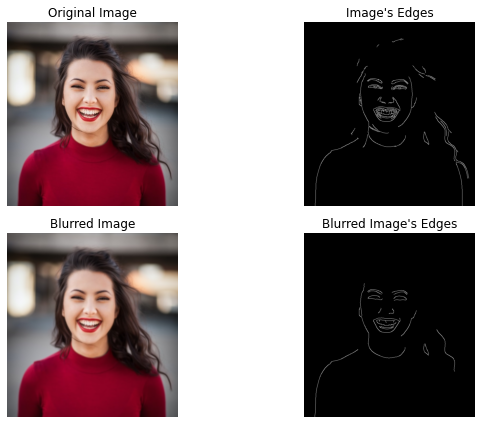

In [63]:
orig_img = cv.imread("assets/Photos/lady.jpg")

#apply canny edge detection
img_edge = cv.Canny(orig_img, 100, 250)

#blur the image
blur_img = cv.GaussianBlur(orig_img, (7, 7), 0)

#apply canny edge detector here
blur_img_edge = cv.Canny(blur_img, 100, 250)


#visualize the images
display_images([orig_img, img_edge, blur_img, blur_img_edge], 
               ["Original Image", "Image's Edges", "Blurred Image", "Blurred Image's Edges"])

Clearly, blurness has reduced the number of edges.

**Sobel Operator**

- The Sobel operator is a popular edge detection method that calculates the gradient magnitude and direction of an image.  

- It is a gradient-based approach that provides an approximation of the image's first derivative in both the x and y directions. 

- OpenCV provides the `cv2.Sobel(image, cv2.CV_64F, dx, dy, ksize)` function to apply the Sobel operator for edge detection.

- The Sobel operator, like many other edge detection algorithms, typically requires grayscale images as input. 

Where:

`image`: The input image on which the Sobel operator will be applied.

`cv2.CV_64F`: The data type of the output image.

`1 and 0`: The order of the derivatives in the x and y directions, respectively.

`ksize`: The size of the Sobel kernel. A value of 3 indicates a 3x3 kernel.



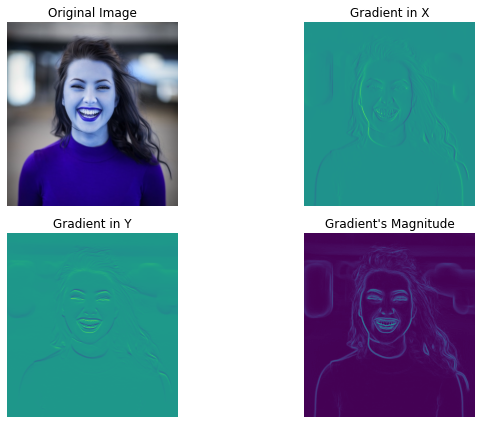

In [68]:
orig_img = cv.imread("assets/Photos/lady.jpg")

grey_img = cv.cvtColor(orig_img, cv.COLOR_BGR2GRAY)

# Apply Sobel edge detection
#gradient in x
sobel_x = cv.Sobel(grey_img, cv.CV_64F, 1, 0, ksize=3)

#gradient in x
sobel_y = cv.Sobel(grey_img, cv.CV_64F, 0, 1, ksize=3)

# Calculate the gradient magnitude 
gradient_magnitude = cv.magnitude(sobel_x, sobel_y)

#visualize original image and its gradients
display_images([orig_img, sobel_x, sobel_y, gradient_magnitude], 
               ["Original Image", "Gradient in X", "Gradient in Y", "Gradient's Magnitude"], cv2_image=False)


**Laplacian as Gaussian**

The Laplacian of Gaussian (LoG) is an edge detection algorithm that combines the Laplacian operator and Gaussian smoothing. It is used to detect edges and other features in an image by enhancing sudden intensity changes.

- **Gaussian Smoothing**: The image is convolved with a Gaussian kernel to smooth out noise and reduce the effects of high-frequency components. The Gaussian smoothing helps to eliminate noise while preserving the edges.

- **Laplacian Filtering**: The Laplacian operator is applied to the smoothed image to calculate the second-order derivative with respect to both x and y directions. The Laplacian emphasizes areas with rapid intensity changes, such as edges.

- **Zero Crossing Detection**: The Laplacian response is examined to identify zero crossings, which occur at the edges. Zero crossings represent the transitions from bright to dark or vice versa, indicating the presence of edges.

- `cv2.Laplacian()` is used to apply the Laplacian of Gaussian operator. The function takes the following parameters:

    - **image**: The input image on which the operator is applied. It should be a grayscale image (`CV_8U` or `CV_64F`).
    
    - **cv2.CV_64F**: The desired depth of the output image, indicating that the result should be a 64-bit floating-point image to handle negative values.
    - **ksize**: The size of the Gaussian kernel used for smoothing. It should be an odd number (e.g., 3, 5, 7, etc.).

    - **sigma**: The standard deviation of the Gaussian kernel. It determines the amount of smoothing applied to the image.



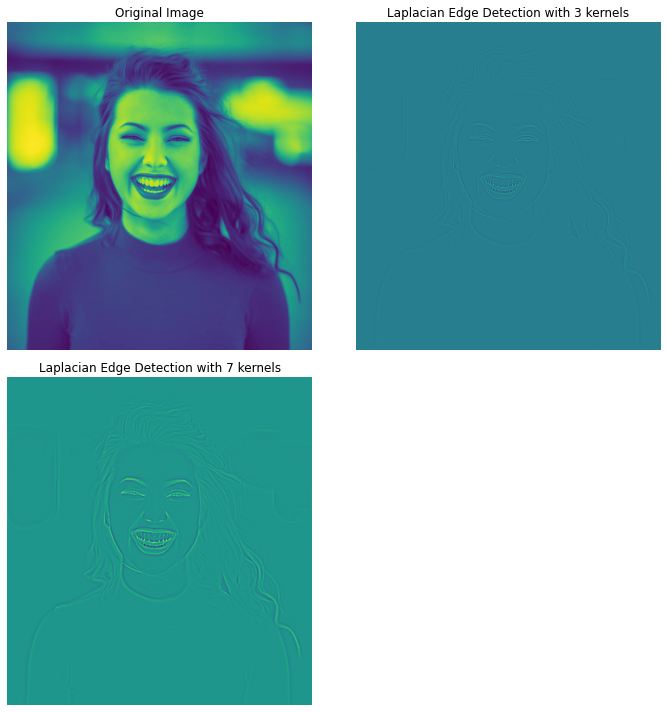

In [142]:
orig_img = cv.imread("assets/Photos/lady.jpg")

grey_img = cv.cvtColor(orig_img, cv.COLOR_BGR2GRAY)

# Apply laplacian edge detection
img_laplace_3 = cv.Laplacian(grey_img, cv.CV_64F, ksize=3)

#with more kernel size
img_laplace_7 = cv.Laplacian(grey_img, cv.CV_64F, ksize=7)



#visualize original image and its gradients
display_images([grey_img, img_laplace_3, img_laplace_7], 
               ["Original Image", "Laplacian Edge Detection with 3 kernels", "Laplacian Edge Detection with 7 kernels"], figsize=(10, 10),cv2_image=False)

## Image Dilating

- Image dilation is a morphological operation used to enhance or expand regions of interest in an image. 

- It is commonly used to thicken or grow the boundaries of objects, close small gaps, or merge nearby regions.

-  `cv2.dilate()` is used to perform image dilation. The function takes the following parameters:

    - **image**: The input image on which dilation is applied. It should be a grayscale image (CV_8U or CV_16U).
    - **kernel**: The structuring element used for dilation. It determines the shape and size of the dilation operation. 
    - **iterations**: The number of times dilation is applied. Increasing the number of iterations results in more pronounced dilation effects.

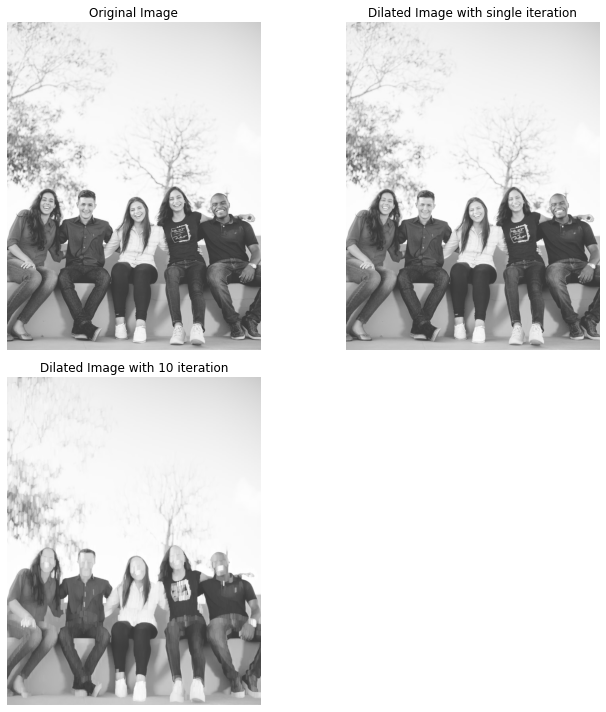

In [133]:
#orig image
orig_img = cv.imread("assets/Photos/group 2.jpg")
#gray image transformation
grey_img = cv.cvtColor(orig_img, cv.COLOR_BGR2GRAY)

#image dilation with 1 iteration
dilated_img_1 = cv.dilate(grey_img, (5, 5), iterations=1)

#image dilation with 10 iteration
dilated_img_10 = cv.dilate(grey_img, (5, 5), iterations=10)

#visualize both images

display_images([grey_img, dilated_img_1, dilated_img_10], 
               ["Original Image", "Dilated Image with single iteration", "Dilated Image with 10 iteration"], figsize=(10, 10))


## Image Eroding

- Image erosion is a morphological operation used to shrink or erode the boundaries of regions in an image.

- It is commonly used to remove small, unwanted details or to separate connected objects.

- `cv2.erode()` is used to perform image erosion. The function takes the following parameters:

    - **image**: The input image on which erosion is applied. It should be a grayscale image (CV_8U or CV_16U).
    - **kernel**: The structuring element used for erosion. It determines the shape and size of the erosion operation.
    - **iterations**: The number of times erosion is applied. Increasing the number of iterations results in more pronounced erosion effects.


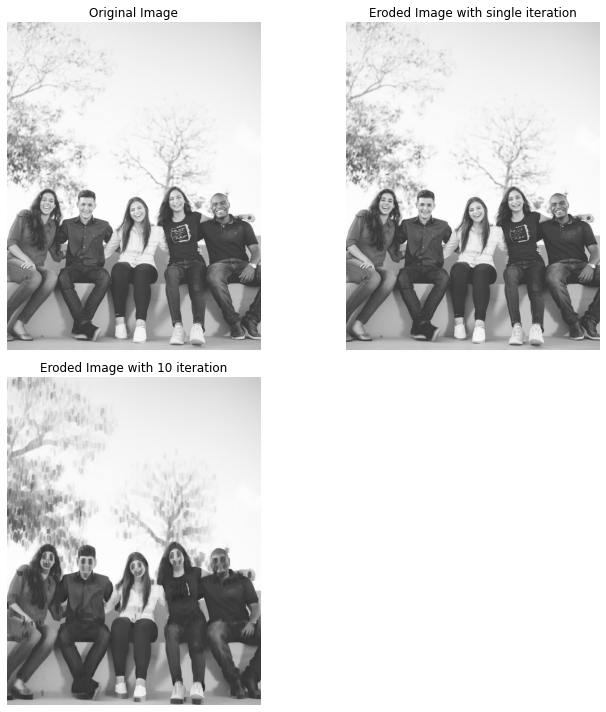

In [132]:
#orig image
orig_img = cv.imread("assets/Photos/group 2.jpg")
#gray image transformation
grey_img = cv.cvtColor(orig_img, cv.COLOR_BGR2GRAY)

#image dilation with 1 iteration
eroded_img_1 = cv.erode(grey_img, (5, 5), iterations=1)

#image dilation with 10 iteration
eroded_img_10 = cv.erode(grey_img, (5, 5), iterations=10)

#visualize both images

display_images([grey_img, eroded_img_1, eroded_img_10], 
               ["Original Image", "Eroded Image with single iteration", "Eroded Image with 10 iteration"], figsize=(10,10))

## Contour Detection

- Contour detection involves identifying and extracting the outlines or contours of objects in an image.

- Contours are the continuous curves that represent the boundaries of objects or regions with similar intensity or color.

- The goal of contour detection is to determine the shape, size, and location of objects within an image.

- Contours can be used for various tasks, including object recognition, shape analysis, and image segmentation.

- Use `cv2.findContours()` to detect contours in the binary image. The function returns a list of contours found in the image.

- Draw the detected contours using `cv2.drawContours()`.


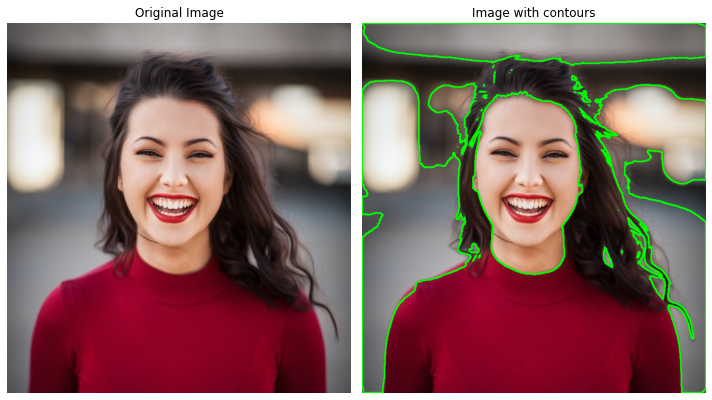

In [152]:
#orig image
lady_img = cv.imread("assets/Photos/lady.jpg")

#gray image transformation
lady_img_gray = cv.cvtColor(orig_img, cv.COLOR_BGR2GRAY)

# Apply thresholding to create a binary image
ret, threshold_image = cv.threshold(lady_img_gray, 80, 255, cv.THRESH_BINARY)

# Find contours in the binary image
contours, hierarchies = cv.findContours(threshold_image, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

# Draw the contours on the original image
contour_image = cv.drawContours(lady_img.copy(), contours, -1, (0, 255, 0), 2)

display_images([lady_img, contour_image],["Original Image", "Image with contours"])

Blurness reduces total number of contours.

## Face Detection


- Face detection is a popular application of computer vision that involves identifying and locating human faces in images or video streams. 

- OpenCV provides a pre-trained face detection algorithm called Haar cascades, which can be used to detect faces in real-time.

- The `cv2.CascadeClassifier` loads the pre-trained face cascade XML file (`haarcascade_frontalface_default.xml`), which contains the information necessary to detect faces.

- Steps Involved : 

    - An image is loaded using `cv2.imread()`.
    - The image is converted to grayscale using `cv2.cvtColor()`.
    - `face_cascade.detectMultiScale()` is called to perform face detection on the grayscale image. It returns a list of rectangles that represent the detected faces.
    - A rectangle is drawn around each detected face using `cv2.rectangle()`.
    - The image with the detected faces is displayed using `cv2.imshow()`.

**Detect faces**

Input to `cv.CascadeClassifier()` :

- **input image**

- **scaleFactor**: This parameter controls the scale factor by which the image is resized at each image scale. It specifies how much the image size is reduced at each scale. A smaller scale factor results in a slower but more accurate detection. Typically, a value of `1.1` is used, which means reducing the image size by `10%` at each scale.

- **minNeighbors**: This parameter specifies the minimum number of neighbors (rectangles) required for a detected region to be considered a face. Higher values result in stricter detection by suppressing false-positive regions. It helps to eliminate small, isolated detections. The recommended range is between `3` and `6`.

In [169]:
grp_img = cv.imread("assets/Photos/group 2.jpg")

#gray image transformation
grp_img_gray = cv.cvtColor(grp_img, cv.COLOR_BGR2GRAY)

#load the classifier
haar_cascade = cv.CascadeClassifier(cv.data.haarcascades + "haarcascade_frontalface_default.xml")

#get face cordinates 
faces_rect = haar_cascade.detectMultiScale(grp_img_gray, scaleFactor=1.1, minNeighbors=5)

print(len(faces_rect))
faces_rect

6


array([[ 77, 430,  52,  52],
       [399, 425,  52,  52],
       [511, 440,  49,  49],
       [301, 452,  51,  51],
       [ 77, 465,  55,  55],
       [173, 441,  52,  52]], dtype=int32)

`faces_rect` contains all the four coordinates of found faces in the input image. Those coordinates are namely `x`, `y`, `w` and `h`.

**Draw rectangle over faces**

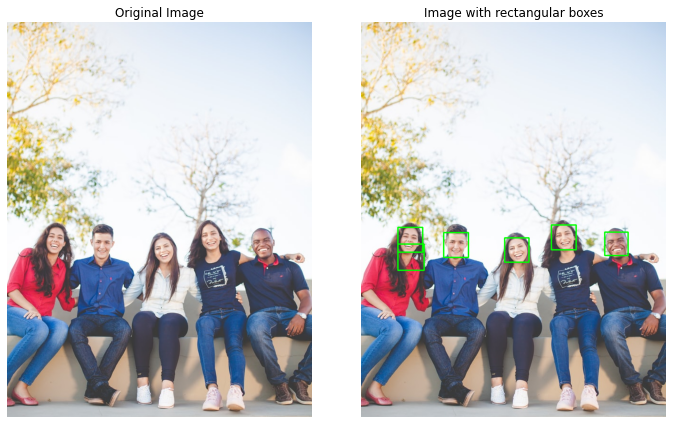

In [170]:
grp_img_with_rect = grp_img.copy()

#iterate over all the cordinates and draw the rectangles
for (x, y, w, h) in faces_rect:

    cv.rectangle(grp_img_with_rect, (x, y), (w+x, h+y), (0, 255, 0), thickness=2)

#visualize the result
display_images([grp_img, grp_img_with_rect], ["Original Image", "Image with rectangular boxes"])




## Face Recognition

- Face recognition is a task in computer vision that involves identifying or verifying the identity of individuals based on their facial features. 

- OpenCV provides several approaches for face recognition, including traditional methods like Eigenfaces, Fisherfaces, and Local Binary Patterns (LBPs), as well as more advanced deep learning-based approaches.

Steps Involve:

- **Face Data Collection**:

    - Collect a dataset of face images for each individual you want to recognize. Ensure that the images are well-aligned and have consistent lighting conditions.

    - Store the face images in separate directories or with labels indicating the corresponding person's identity.

- **Face Data Preprocessing**:

    - Convert the face images to grayscale.

    - Resize the images to a fixed size to ensure consistent input dimensions.

- **Face Recognition Model Training**:

    - Use the `cv2.face.BPHFaceRecognizer_create()` function to create an Eigenface recognizer object.
    
    - Load the face images and corresponding labels into the recognizer using the `read()` method.
    
    - Train the recognizer using the `train()` method, which learns the underlying face representation from the provided dataset.

- **Face Recognition**:
    
    - Capture or load a new face image to be recognized.
    
    - Preprocess the image (convert to grayscale, resize, etc.) using the same steps as during training.
    
    - Pass the preprocessed image to the recognizer's `predict()` method to obtain the predicted label and confidence score.
    
    - Compare the predicted label and confidence score with the known labels and thresholds to determine the recognized person's identity.


In `assets/Faces`, I have `train` and `val` subfolders which contain face images of different hollywood actors.

I will be using OpenCV to construct a face recognition model which can be trained using `assets/Faces/train` data and can be deployed to predict the name of the people by analyzing their facial texture.

**Model's Training**

In [198]:
#define base directory 
BASE_DIR = "../Hands-on-with-openCV/assets/Faces/train"


#for saving facial information and corresponding labels
features = []
labels = []

#define the label names
classes = ["Ben Afflek", "Elton John", "Jerry Seinfield", "Madonna", "Mindy Kaling"]

#load haarcascade model
haar_cascade = cv.CascadeClassifier("assets/haarcascade_frontalface_default.xml")

#iterate over classes

for idx, cls in enumerate(classes):

    #construct path for each class
    img_files_path = os.path.join(BASE_DIR, cls)
    #iterate over each image for a class
    for img_path in os.listdir(img_files_path):

        img_path = os.path.join(img_files_path, img_path)
        face_img = cv.imread(img_path)
        #gray color transformation
        face_img_gray = cv.cvtColor(face_img, cv.COLOR_BGR2GRAY)
        #face detections
        #detect faces
        face_rect = haar_cascade.detectMultiScale(face_img_gray, scaleFactor=1.1, minNeighbors=3)
        
        #iterate over coordinates
        for x, y, w, h in face_rect:

            #extract the images
            extracted_face = face_img_gray[y:y+h, x:x+h]
            #append it into features list
            features.append(extracted_face)
            #populate labels
            labels.append(idx)


print('Training done ---------------')

features = np.array(features, dtype='object')
labels = np.array(labels)

#create face recognition model

face_recognizer = cv.face.LBPHFaceRecognizer_create()

# Train the Recognizer on the features list and the labels list
face_recognizer.train(features, labels)

#save the extracted features, labels and the trained models
face_recognizer.save('face_trained.yml')
np.save('features.npy', features)
np.save('labels.npy', labels)



Training done ---------------


**Model's Inference**

Since traning is done we can use trained model to do inference over unseen images. In `Faces` folder we have `val` subfolder which contains new images. Let's see how the trained model is performing over validation dataset.

ben_afflek


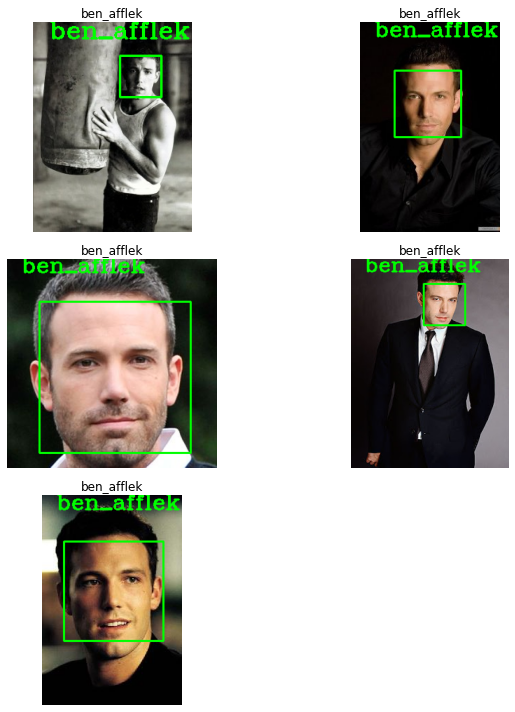

elton_john


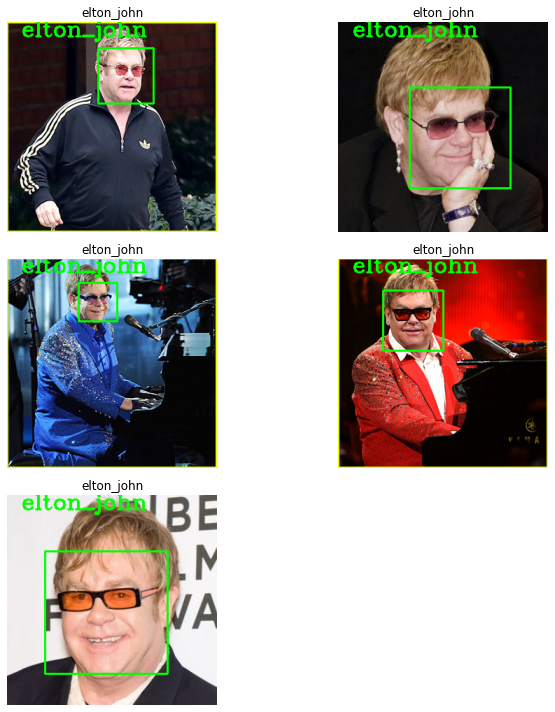

jerry_seinfeld


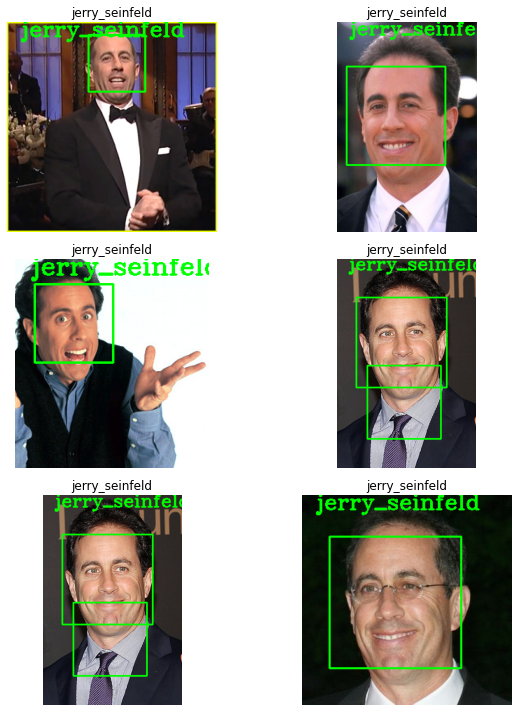

madonna


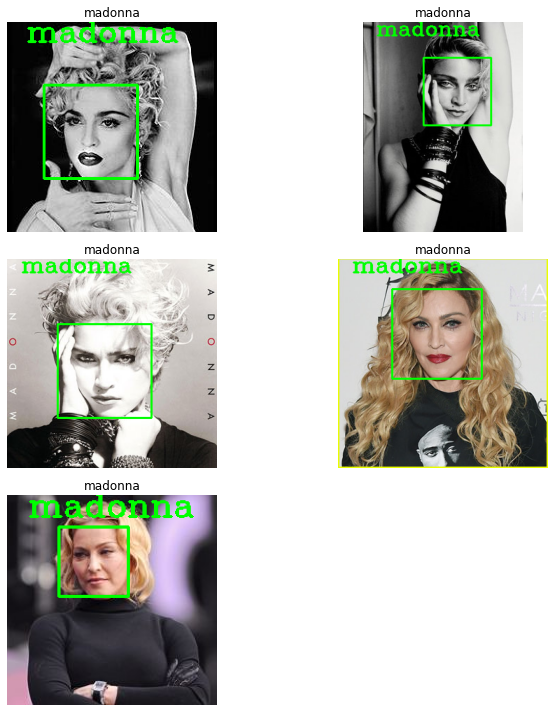

mindy_kaling


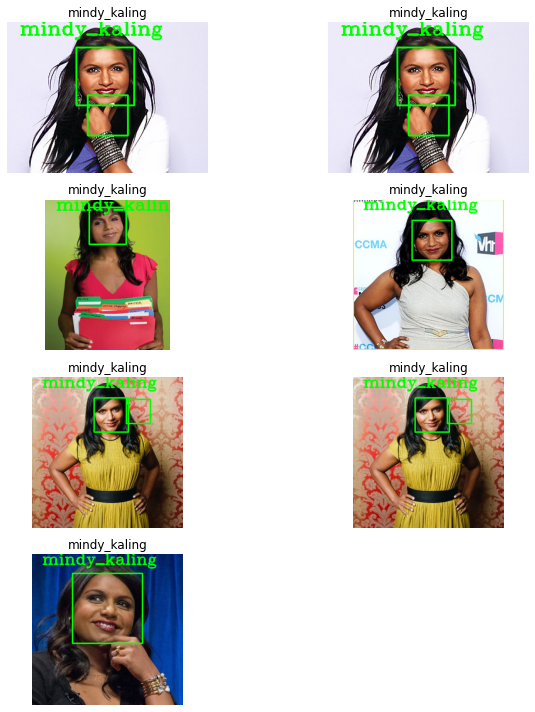

In [204]:
#define the labels names
classes = ["ben_afflek", "elton_john", "jerry_seinfeld", "madonna", "mindy_kaling"]

#load haarcascade model
haar_cascade = cv.CascadeClassifier("assets/haarcascade_frontalface_default.xml")

#load saved model and it's weight
face_recognizer_trained = cv.face.LBPHFaceRecognizer_create()
face_recognizer_trained.read("face_trained.yml")

#load images from validation dataset
BASE_DIR = "../Hands-on-with-openCV/assets/Faces/val"

for idx, cls in enumerate(classes):

    print(cls)
    class_path = os.path.join(BASE_DIR, cls)
    class_imgs = []
    #iterate over images in each class
    for img_path in os.listdir(class_path):

        img_path = os.path.join(class_path, img_path)
        img_arr = cv.imread(img_path)
        #gray image transformation
        img_gray = cv.cvtColor(img_arr, cv.COLOR_BGR2GRAY)
        #extract face
        face_rect = haar_cascade.detectMultiScale(img_gray, scaleFactor=1.1, minNeighbors=3)
        #iterate over all the coordinates
        for x, y, w, h in face_rect:

            face_roi = img_gray[y:y+h, x:x+w]
            label, confidence = face_recognizer.predict(face_roi)
            #put the name and rectangular box
            cv.putText(img_arr, str(classes[idx]), (20, 20), cv.FONT_HERSHEY_COMPLEX, 1.0, (0, 255, 0), thickness=2)
            cv.rectangle(img_arr, (x, y), (w+x, h+y), (0, 255, 0), thickness=2)
            class_imgs.append(img_arr)

    display_images(class_imgs, [cls]*len(class_imgs), figsize=(10, 10))


Okay model seems 100% accurate over Validation set.